##  一、数据可视化和摘要

## 1.1  数据集摘要

### 1.1.1   数据介绍
  
  根据Variety杂志的报道，“为了确定年度最热门的视频，YouTube使用了多种因素，包括衡量用户互动（观看次数，分享，评论和喜欢）。请注意，它们不是整个日历年中观看次数最多的视频“。 YouTube趋势列表中的优秀表演者是音乐视频（例如着名的男性化的“Gangam Style”），名人和/或真人秀电视节目，以及YouTube众所周知的随机照相机病毒视频。
此数据集是热门YouTube热门视频的每日记录。
该数据集包括每日热门YouTube视频的数月（和计数）数据。数据包括美国，GB，DE，CA和FR地区（分别为美国，英国，德国，加拿大和法国），每天最多可列出200个热门视频。数据集中包含各个地区的视频的[video_id], [trending_date], [title], [channel_title], [category_id],[publish_time], [tags], [views], [likes], [dislikes], [comment_count],[thumbnail_link],[comments_disabled],[ratings_disable]，[video_error_or_removed],[description']等信息

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pandas import DataFrame,Series
from scipy import stats
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures 

In [4]:
filename='C:/Users/nancy/Downloads/YouTube/FRvideos.csv'
#df=pd.read_csv(filename,encoding='ANSI')
df=pd.read_csv(filename)

数据一共有16列，40724行。
 
 其中，标称属性有[video_id], [trending_date], [title], [channel_title], [category_id],[publish_time], [tags],[thumbnail_link],[comments_disabled],[ratings_disable]，[video_error_or_removed],[description']。 数值属性有[views], [likes], [dislikes],[comment_count]。

In [5]:
cols = df.columns
print(df.shape)
print(cols)

(40724, 16)
Index(['video_id', 'trending_date', 'title', 'channel_title', 'category_id',
       'publish_time', 'tags', 'views', 'likes', 'dislikes', 'comment_count',
       'thumbnail_link', 'comments_disabled', 'ratings_disabled',
       'video_error_or_removed', 'description'],
      dtype='object')


### 1.1.1   标称数据摘要
 标称数据中具有统计意义的信息统计了每个取值所对应的频数。
 
 分别是[channel_title], [category_id],[publish_time],[tags],[comments_disabled],[ratings_disable]
 

In [7]:
cname='channel_title'
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
a=df.groupby(by=cname).size()
print(a)

channel_title
#AndresSTyle                                                      1
#Débloqués                                                        2
* Playmo Tube *                                                   3
- NS -                                                            3
- 欢迎订阅 -浙江卫视【奔跑吧】官方频道                                            15
-M- Matthieu Chedid Officiel                                      1
01Team3V                                                          1
01netTV                                                          26
10-Minutes Satisfaction                                           1
100% ASSE                                                        10
100% BITUME                                                       7
100% INCROYABLE                                                   1
100% MOTOS                                                       23
100% Mobylette - Youngtimer                                       1
100% RIRES                        

In [20]:
cname='category_id'
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
a=df.groupby(by=cname).size()
print(a)

category_id
1     2157
2      673
10    3946
15     237
17    4342
19     119
20    1459
22    5719
23    4343
24    9819
25    3752
26    2361
27     769
28     802
29     114
30      11
43      99
44       2
dtype: int64


In [21]:
cname='publish_time'
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
a=df.groupby(by=cname).size()
print(a)

publish_time
2009-03-22T19:58:05.000Z     1
2009-07-23T17:24:25.000Z     1
2009-10-31T22:14:53.000Z     1
2010-02-15T11:10:11.000Z     1
2011-10-25T17:39:05.000Z     1
2012-11-30T02:25:54.000Z     1
2013-04-06T14:24:05.000Z     2
2013-04-27T19:13:42.000Z     1
2013-06-05T02:45:03.000Z     1
2013-08-16T17:15:29.000Z     2
2013-10-18T12:35:33.000Z     1
2014-01-30T14:16:04.000Z     1
2014-02-28T09:30:01.000Z     1
2014-04-22T13:36:35.000Z     1
2014-05-05T10:22:50.000Z     1
2014-06-09T13:52:56.000Z     1
2014-08-03T11:17:54.000Z     1
2015-01-24T19:31:41.000Z     1
2015-03-26T10:29:44.000Z     1
2015-07-20T15:14:07.000Z     1
2015-09-21T17:14:12.000Z     1
2015-10-05T10:01:24.000Z     1
2015-11-09T10:30:28.000Z     1
2015-11-21T22:35:17.000Z     1
2016-03-05T21:44:30.000Z     1
2016-05-07T11:16:31.000Z     1
2016-05-07T11:44:03.000Z     1
2016-05-12T03:52:15.000Z     1
2016-05-30T10:54:13.000Z     1
2016-06-14T16:04:43.000Z     1
2016-06-14T16:40:57.000Z     1
2016-07-30T20:34:29.000Z  

In [22]:
cname='tags'
print(df[cname].head())
df.groupby(by=cname).size()


0    Raptor"|"Dissident"|"Expliquez"|"moi"|"cette"|...
1                                               [none]
2        cartoon"|"pokémon"|"école"|"ours"|"мультфильм
3    Papy grenier"|"Metal Gear Solid"|"PS1"|"Tirage...
4    vélo"|"vtt"|"bmx"|"freestyle"|"bike"|"mtb"|"di...
Name: tags, dtype: object


tags
#13hFoot                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                1
#20hFoot                                                                                                                                                                                                                                                                                                                                                 

In [13]:
cname='comments_disabled'
pd.set_option('display.max_columns', None)#显示所有行
pd.set_option('display.max_rows', None)#显示所有列
a=df.groupby(by=cname).size()
print(a)

comments_disabled
False    40316
True       633
dtype: int64


In [19]:
cname='ratings_disabled'
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
a=df.groupby(by=cname).size()
print(a)

ratings_disabled
False    40780
True       169
dtype: int64


In [20]:
cname='video_error_or_removed'
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
a=df.groupby(by=cname).size()
print(a)

video_error_or_removed
False    40926
True        23
dtype: int64


### 1.1.2  数值数据摘要与可视化
 对于[views], [likes], [dislikes],[comment_count]这四个数值属性我们分别给出它们最大、最小、均值、中位数、四分位数及缺失值的个数。接着我们根据统计结果在剔除了缺失数据后绘制了它们的分布直方图，QQ图检和盒图，并对它们进行了分析。

### [views]可视化
下表显示[views]一共有40949条记录，它们的均值是2360785，最小值是549，中位数是681861，剩下的四分位数分别是242329和18231570，最大值是225211900。

In [23]:
cname='views'
print(df[cname].describe())
loss=len(df)-df[cname].count()
print("缺失值个数：",loss)

count    4.072400e+04
mean     4.199219e+05
std      1.772130e+06
min      2.230000e+02
25%      1.697450e+04
50%      7.372100e+04
75%      2.708088e+05
max      1.009116e+08
Name: views, dtype: float64
缺失值个数： 0


 ###  [views]直方图绘制
 

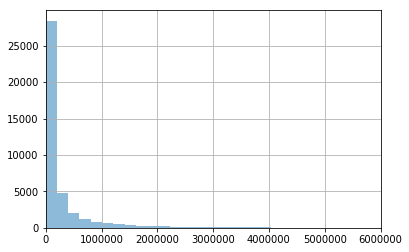

In [24]:
#直方图绘制
plt.xlim(0,6000000)
df[cname].hist(alpha=0.5,bins=500)
plt.show()

### [views] QQ图绘制


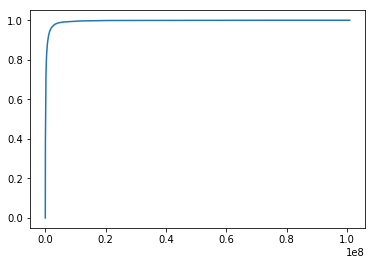

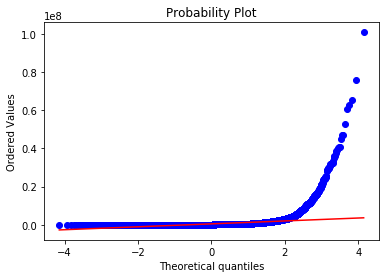

In [25]:
#累计分布图绘制
x=np.sort(df[cname])
y=np.arange(len(x))/float(len(x))
plt.plot(x,y)
plt.show()
#QQ图绘制
#x_label = stats.norm.ppf(y)
#plt.scatter(x_label, x)
#plt.show()
stats.probplot(df[cname], dist="norm", plot=plt)
plt.show()

 ###  [views]盒图绘制


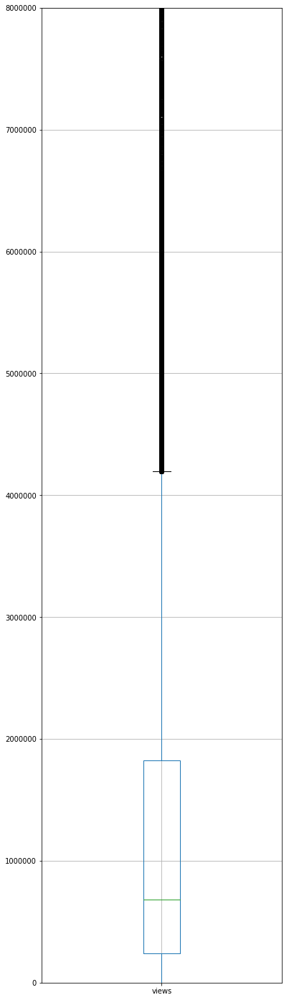

In [69]:
#盒图绘制
a=DataFrame(df,columns=[cname])
#a.boxplot()
a.boxplot(figsize=(6,25))
plt.ylim(0,8000000)
plt.show()


### [likes]可视化
根据下表显示[likes]一共有4.094900e+04条记录，它们的均值是7.426670e+04，最小值是0，中位数是 1.809100e+04，剩下的四分位数分别是5.424000e+03和5.541700e+04，最大值是 5.613827e+06。

In [26]:
cname='likes'
a=DataFrame(df,columns=[cname])
a=a.dropna()#去除缺失值
print(a[cname].describe())
loss=len(df)-a[cname].count()
print("缺失值个数：",loss)


count    4.072400e+04
mean     1.738886e+04
std      8.720509e+04
min      0.000000e+00
25%      3.380000e+02
50%      1.892500e+03
75%      7.969500e+03
max      4.750254e+06
Name: likes, dtype: float64
缺失值个数： 0


### [likes]直方图绘制

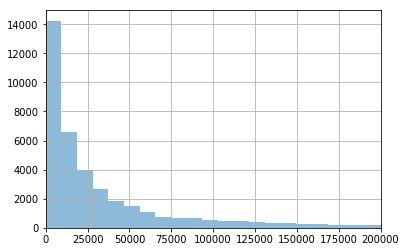

In [73]:
#直方图绘制
plt.xlim(0,200000)
a[cname].hist(alpha=0.5,bins=600)
plt.show()


### [likes]QQ图绘制


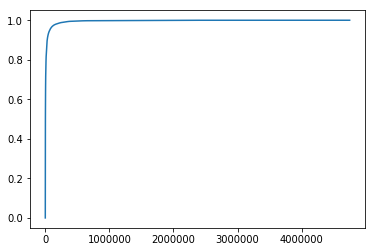

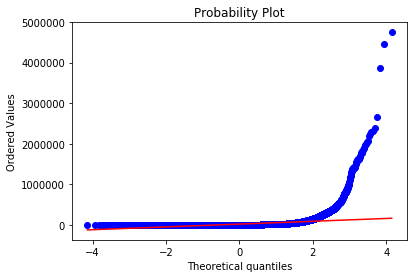

In [27]:
#累计分布图绘制
x1=np.sort(a[cname])
y1=np.arange(len(x1))/float(len(x1))
plt.plot(x1,y1)
plt.show()
#QQ图绘制
#x_label = stats.norm.ppf(y)
#plt.scatter(x_label, x)
#plt.show()
stats.probplot(a[cname], dist="norm", plot=plt)
plt.show()


### [likes]盒图绘制
 绘制结果显示[likes]中存在大的离群值（图中的黑色散点）

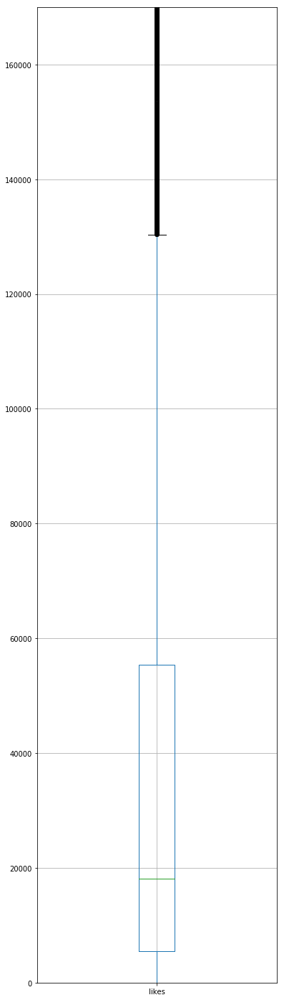

In [75]:
#盒图绘制
a.boxplot(figsize=(6,25))
plt.ylim(0,170000)
plt.show()

### [dislikes]可视化
根据下表显示[dislikes]一共有4.094900e+04条记录，它们的均值是3.711401e+03，最小值是0，中位数是 6.310000e+02，剩下的四分位数分别是2.020000e+02和1.938000e+03，最大值是 1.674420e+06

In [28]:
cname='dislikes'
a=DataFrame(df,columns=[cname])
a=a.dropna()#去除缺失值
print(a[cname].describe())
loss=len(df)-a[cname].count()
print("缺失值个数：",loss)

count    4.072400e+04
mean     8.149624e+02
std      1.139219e+04
min      0.000000e+00
25%      1.800000e+01
50%      8.300000e+01
75%      3.350000e+02
max      1.353661e+06
Name: dislikes, dtype: float64
缺失值个数： 0


### [dislikes]直方图绘制


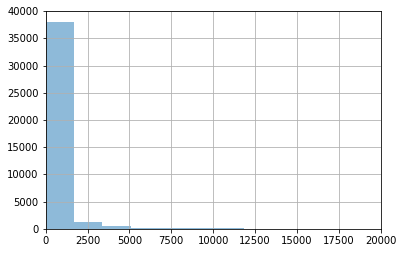

In [29]:

#直方图绘制
plt.xlim(0,20000)
a[cname].hist(alpha=0.5,bins=800)
plt.show()

### [dislikes]QQ图绘制


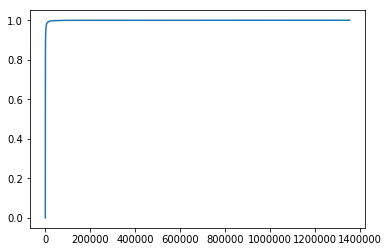

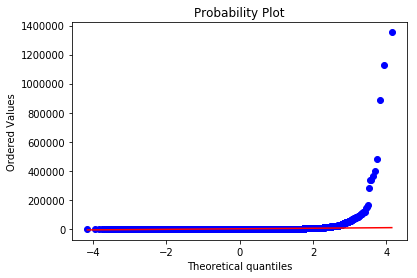

In [30]:

#累计分布图绘制
x1=np.sort(a[cname])
y1=np.arange(len(x1))/float(len(x1))
plt.plot(x1,y1)
plt.show()


#QQ图绘制
stats.probplot(a[cname], dist="norm", plot=plt)
plt.show()

### [dislikes]盒图绘制
绘制结果显示[dislikes]中存在大的离群值（图中的黑色散点）

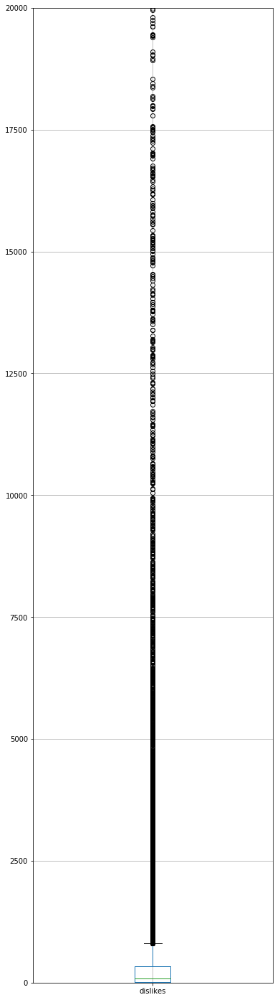

In [31]:

#盒图绘制
a.boxplot(figsize=(6,25))
plt.ylim(0,20000)
plt.show()


### [comment_count]可视化
根据下表显示 [comment_count]一共有 4.094900e+04条记录，它们的均值是8.446804e+03，最小值是0，中位数是1.856000e+03，剩下的四分位数分别是6.140000e+02和5.755000e+03，最大值是 1.361580e+06。

In [32]:
cname='comment_count'
a=DataFrame(df,columns=[cname])
a=a.dropna()#去除缺失值
print(a[cname].describe())
loss=len(df)-a[cname].count()
print("缺失值个数：",loss)


count    4.072400e+04
mean     1.832453e+03
std      1.404321e+04
min      0.000000e+00
25%      5.600000e+01
50%      2.350000e+02
75%      8.410000e+02
max      1.040912e+06
Name: comment_count, dtype: float64
缺失值个数： 0


### [comment_count]直方图绘制


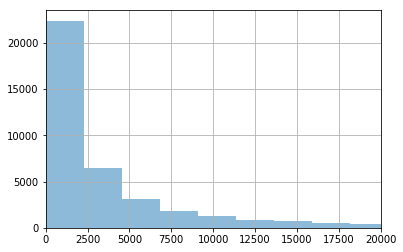

In [84]:
#直方图绘制
plt.xlim(0,20000)
a[cname].hist(alpha=0.5,bins=600)
plt.show()


### [comment_count]QQ图绘制

绘制结果显示 [comment_count]不符合正态分布

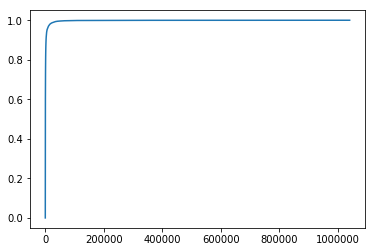

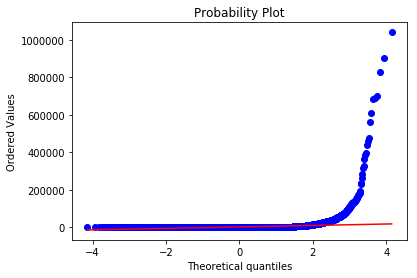

In [33]:
#累计分布图绘制
x1=np.sort(a[cname])
y1=np.arange(len(x1))/float(len(x1))
plt.plot(x1,y1)
plt.show()
#QQ图绘制
#x_label = stats.norm.ppf(y)
#plt.scatter(x_label, x)
#plt.show()
stats.probplot(a[cname], dist="norm", plot=plt)
plt.show()


### [comment_count]盒图绘制
 绘制结果显示[comment_count]中存在大的离群值（图中的黑色散点）

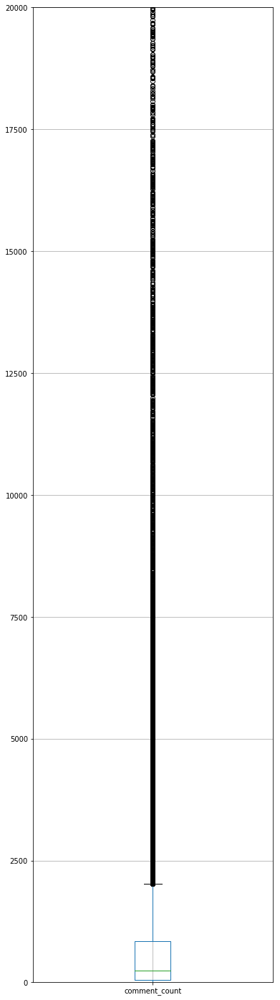

In [34]:
#盒图绘制
a.boxplot(figsize=(6,25))
plt.ylim(0,20000)
plt.show()